<a href="https://colab.research.google.com/github/1900690/strawberry/blob/main/strawberry_leaf_calculation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#葉の面積を計算する方法

1.   画像を撮影（画像内に大きさがわかるものを入れて撮影する（例 定規）
2.   画像の葉の部分を検出するために[FastLabel](https://fastlabel.ai/)にアクセスしてアカウントを作成する
3.   [ドキュメントのクイックスタート](https://fastlabel.notion.site/7b2efd19c1104ef8a869862fbd02fcfa)に従いプロジェクトを作成する（タイプは「画像」の「セグメンテーション」、「オーバーレイモード」を使用するに設定する）
4.   「新規タスクを作成する」の部分で撮影した画像をアップロードする
5.   「アノテーションクラスを定義する」の部分でアノテーションクラスを作成する（名前や色は任意で良い）
6.   「アノテーションを開始する」の部分で「アノテーションクラス」を選択したのちに上に出てくるメニューバーから「スーパーピクセル」を選択して葉の部分のみを選択していく
7.   「タスクのアノテーションを出力する」の部分で「画像出力」の部分を「マスク－インデックスカラー」を選択し「エクスポート」ボタンを押す。エクスポートが終わったらエクスポート履歴からダウンロードを選択する



Saving image_67229953.png to image_67229953.png
Saving image_67229953.jpg to image_67229953.jpg
葉のピクセルの数 6507472.0
全画面のうち葉が占める割合 0.53


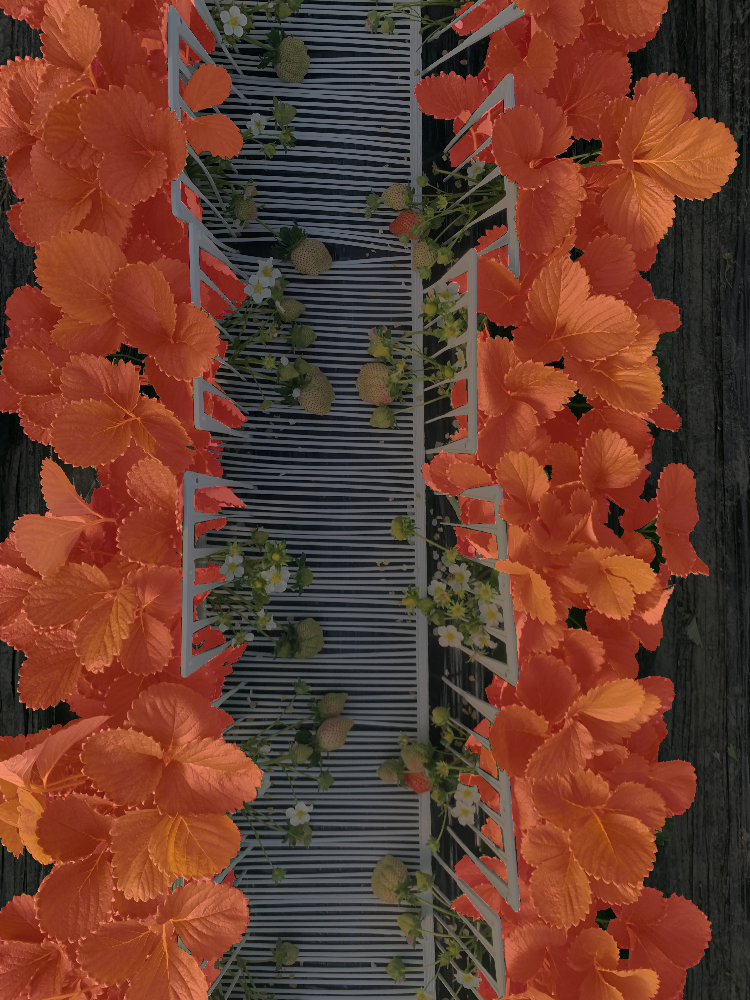

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#@title 8.   ↙の再生ボタンを押して、出てきた「ファイル選択」を押し、もともとの画像（.jpg）と7.でダウンロードしたフォルダの中のmask_direct_color/instance_segmentationsに入っている.pngの両方のファイルをアップロードする。出てきた画像の上に表示される"葉のピクセルの数"が葉の面積を表す。
#@markdown ※ダウンロードされるファイルのタイトルの0から始まる数値が全画面のうち葉が占める割合を示しています。（例50%→050）
import cv2  #OpenCVのインポート
import numpy as np  #numpyのインポート
from google.colab.patches import cv2_imshow
import shutil
import os
from google.colab import files
import glob

# .jpgまたは.pngの拡張子を持つファイルを抽出して消去
filesname = os.listdir("/content/")
for file in filesname:
    if file.endswith(".jpg") or file.endswith(".png"):
        # ファイルを削除
        os.remove("/content/" + file)


#データをアップロード
uploaded = files.upload()
#ファイル名を取得
filename = os.path.splitext(list(uploaded.keys())[0])[0]

fname="/content/"+filename+".png" #開く画像ファイル名
threshold=0 #二値化閾値

img_color= cv2.imread(fname) #画像を読み出しオブジェクトimg_colorに代入
img_gray = cv2.imread(fname,cv2.IMREAD_GRAYSCALE) #画像をグレースケールで読み出しオブジェクトimg_grayに代入
img_blur = cv2.blur(img_gray,(9,9)) #img_grayを平均化領域9x9で平均化処理しimg_blurに代入

ret, img_binary= cv2.threshold(img_blur, threshold, 255, cv2.THRESH_BINARY) #オブジェクトimg_blurを閾値threshold(127)で二値化しimg_binaryに代入

pixel_number = np.size(img_binary) #全ピクセル数をpixel_numberに代入
pixel_sum = np.sum(img_binary) #全ピクセルの輝度の合計をpixel_sumに代入
white_pixel_number = pixel_sum/255 #白いピクセルの数を計算しwhite_pixel_numberに代入
black_pixel_number = pixel_number - white_pixel_number #黒いピクセルの数を計算しwhite_pixel_numberに代入
print("葉のピクセルの数",white_pixel_number) #白いピクセルの数を表示
ratio=round(white_pixel_number/pixel_number,2)
print("全画面のうち葉が占める割合",ratio) #黒いピクセルの数を表示

#元画像と合成
dst=cv2.addWeighted(cv2.imread("/content/"+filename+".jpg"), 0.5, cv2.imread("/content/"+filename+".png"), 0.5, 0)
cv2_imshow(dst)
cv2.imwrite("/content/"+filename+"_0"+str(int(ratio*100))+".jpg", dst)
#ファイルをダウンロード
files.download("/content/"+filename+"_0"+str(int(ratio*100))+".jpg")